In [20]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [35]:
"""Reading the simulations"""

import matplotlib.pyplot as plt 
import numpy as np
import pynbody

s=pynbody.load('/srv/cosmdatc/clues/B64_WM3_186592/LG/GAS_SFR/4096_Gasoline/1024/WMAP3.CLUES.HR.001024')
h = s.halos()

In [34]:
h1=h[1]
h1.all_keys()

['nefe',
 'hetot',
 'mjeans',
 'ofe',
 'ljeans',
 'ne',
 'feh',
 'c_s',
 'mgfe',
 'oxh',
 'HeIII',
 'sife',
 'mjeans_turb',
 'HII',
 'ljeans_turb',
 'hydrogen',
 'c_s_turb',
 'r_mag',
 'i_mag',
 'K_lum_den',
 'vtheta',
 'U_lum_den',
 'vcxy',
 'j2',
 'I_lum_den',
 'u_mag',
 'cs',
 'vr',
 'vt',
 'H_lum_den',
 'V_lum_den',
 'alt',
 'i_lum_den',
 'u',
 'mu',
 'az',
 'I_mag',
 'vrxy',
 'u_lum_den',
 'J_lum_den',
 'k_mag',
 'v_mag',
 'U_mag',
 'v_mean',
 'h_lum_den',
 'v_lum_den',
 'theta',
 'b_mag',
 'zeldovich_offset',
 'j_mag',
 'B_lum_den',
 'jz',
 'j_lum_den',
 'K_mag',
 'V_mag',
 'v2',
 'J_mag',
 'rho',
 'H_mag',
 'h_mag',
 'B_mag',
 'aform',
 'k_lum_den',
 'te',
 'b_lum_den',
 'temp',
 'ke',
 'age',
 'j',
 'smooth',
 'rxy',
 'p',
 'r',
 'R_lum_den',
 'vphi',
 'r_lum_den',
 'R_mag',
 'v_disp',
 'phi',
 'ESNRate',
 'FeMassFrac',
 'iord',
 'eps',
 'igasorder',
 'vel',
 'HI',
 'pos',
 'coolontime',
 'HeII',
 'mass',
 'massform',
 'OxMassFrac',
 'HeI']

In [23]:
s['vel']

SimArray([[ 0.09434357,  0.22941174,  0.0940725 ],
       [ 0.09537753,  0.23034935,  0.09365172],
       [ 0.09608914,  0.23033538,  0.09413029],
       ..., 
       [ 0.09135041,  0.18238381,  0.06768889],
       [ 0.1255684 ,  0.23419151,  0.06500633],
       [ 0.10277103,  0.23355079,  0.05873904]], '2.21e+03 km a s**-1')

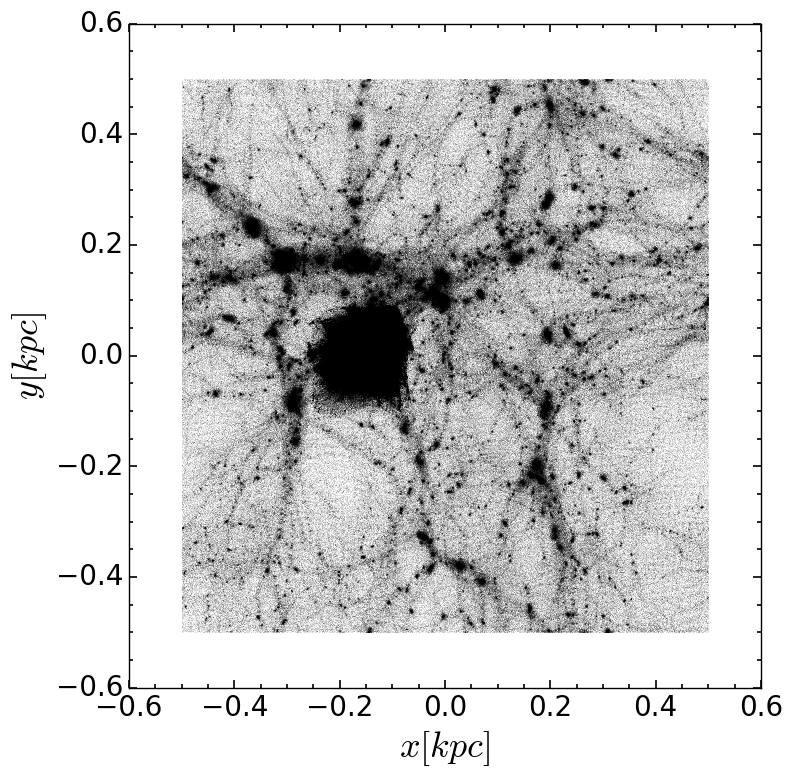

In [25]:
fig=plt.figure(1, figsize=(8,8))
fig.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
ax=fig.add_subplot(111)
ax.plot(s.dm['pos'][:,0],s.dm['pos'][:,1],'.', markersize=0.05, color = 'k')
#ax.set_ylim(-1000,1000)
#ax.set_xlim(-0.7,0)
ax.set_xlabel(u'$x[kpc]$', fontsize=26)
ax.set_ylabel(u'$y[kpc]$', fontsize=26)
ax.minorticks_on()
ax.tick_params( labelsize=20)
ax.tick_params('both', length=3, width=1.2,which='minor')
ax.tick_params('both', length=6, width=1.2,which='major')
plt.show()

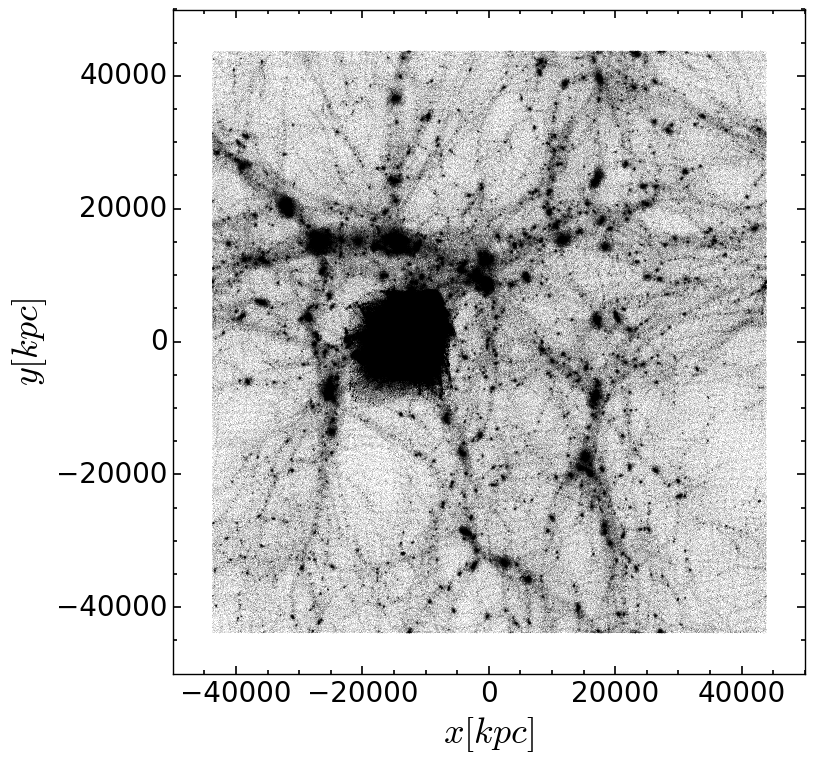

In [24]:
fig=plt.figure(1, figsize=(8,8))
fig.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
ax=fig.add_subplot(111)
ax.plot(s.dm['pos'][:,0].in_units('kpc'),s.dm['pos'][:,1].in_units('kpc'),'.', markersize=0.05, color = 'k')
#ax.set_ylim(-1000,1000)
#ax.set_xlim(-0.7,0)
ax.set_xlabel(u'$x[kpc]$', fontsize=26)
ax.set_ylabel(u'$y[kpc]$', fontsize=26)
ax.minorticks_on()
ax.tick_params( labelsize=20)
ax.tick_params('both', length=3, width=1.2,which='minor')
ax.tick_params('both', length=6, width=1.2,which='major')
plt.show()

166.84


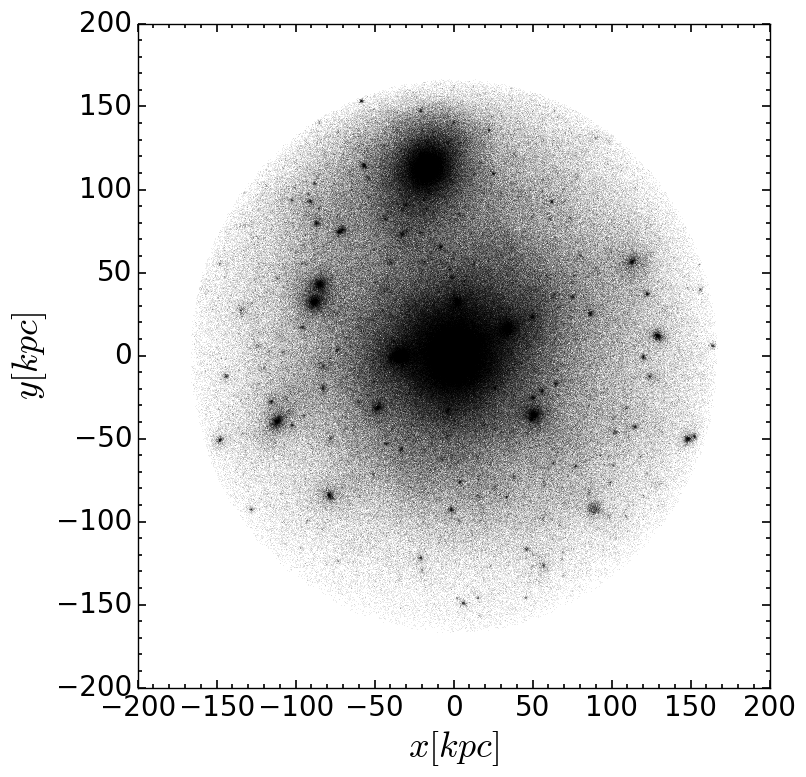

In [29]:
h1=h[1]
rvir = h1.properties['Rvir']
print rvir
cen_pot = pynbody.analysis.halo.center(h1,mode='pot',retcen=True).in_units('kpc')
x = h1.dm['pos'][:,0].in_units('kpc')-cen_pot[0]
y = h1.dm['pos'][:,1].in_units('kpc')-cen_pot[1]
z = h1.dm['pos'][:,2].in_units('kpc')-cen_pot[2]
r = np.sqrt(x**2+y**2+z**2)

limit,=np.where(r < rvir)

fig=plt.figure(1, figsize=(8,8))
fig.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
ax=fig.add_subplot(111)
ax.plot(x[limit],y[limit],'.', markersize=0.05, color = 'k')
#ax.set_ylim(-1000,1000)
#ax.set_xlim(-0.7,0)
ax.set_xlabel(u'$x[kpc]$', fontsize=26)
ax.set_ylabel(u'$y[kpc]$', fontsize=26)
ax.minorticks_on()
ax.tick_params( labelsize=20)
ax.tick_params('both', length=3, width=1.2,which='minor')
ax.tick_params('both', length=6, width=1.2,which='major')
plt.show()

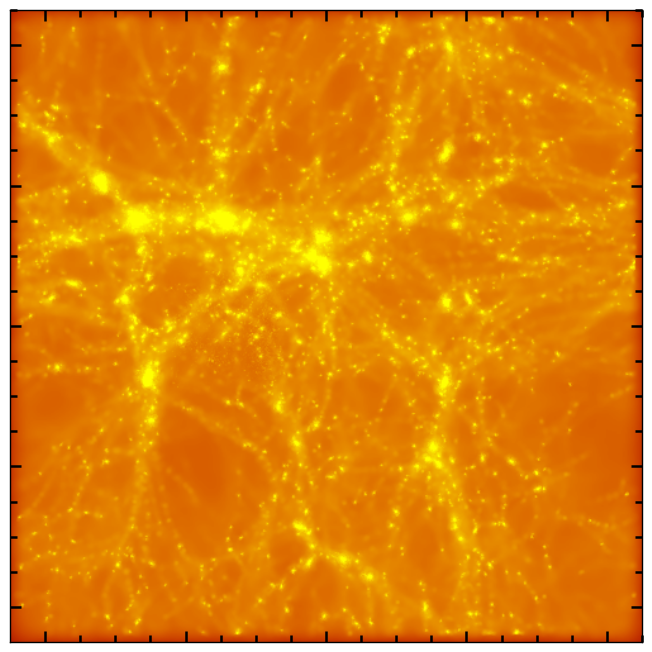

In [44]:
import sphviewer as sph

xn = s.dm['pos'][:,0].in_units('kpc')
yn = s.dm['pos'][:,1].in_units('kpc')
zn = s.dm['pos'][:,2].in_units('kpc')
masa_drk = s.dm['mass'].in_units('Msol')

pos=np.ndarray([3,np.size(xn)])
pos[0,:]=xn
pos[1,:]=yn
pos[2,:]=zn

rl=45000    
corte,=np.where((xn<rl) & (yn<rl) & (zn<rl) & (xn>-rl) & (yn>-rl) & (zn>-rl))

vmin=6
vmax=12

# ----escala de colores que te guste (http://matplotlib.org/examples/color/colormaps_reference.html)---
cmap='gnuplot'

fig=plt.figure(1,figsize=(8,8))
fig.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)

particles=sph.Particles(pos,masa_drk,nb=50)
escena=sph.Scene(particles)
escena.update_camera(r='infinity',x=0,y=0,z=0,extent=[-rl,rl,-rl,rl])
rend=sph.Render(escena)
extent=escena.get_extent()
rend.set_logscale()

ax1=fig.add_subplot(111)
plt.imshow(rend.get_image(),extent=extent,origin='lower',cmap=cmap, vmin=vmin, vmax= vmax)
#plt.axis('off')
#ax1.set_title('Gadget - '+ str('%s'%vector2[i]), fontsize=18)
ax1.set_xticklabels([])
ax1.set_yticklabels([])
#plt.xlabel('$x$'+' $[kpc]$', fontsize=26)
#plt.ylabel('$y$'+' $[kpc]$', fontsize=30)
ax1.minorticks_on()
ax1.tick_params( labelsize=24)
ax1.tick_params('both', length=5, width=1.8,which='minor')
ax1.tick_params('both', length=8, width=1.8,which='major')

1024 166.84
1008 167.57
0992 168.15
0976 168.72
0960 168.79
0944 168.99
0928 169.26
0912 169.34
0896 169.11
0880 166.86
0864 160.14
0848 158.7
0832 158.27
0816 158.16
0800 158.55
0784 158.91
0768 158.9
0752 156.56
0736 156.04
0720 157.14
0704 158.54
0688 159.35
0672 159.88
0656 161.07
0640 162.53
0624 164.07
0608 165.55
0592 166.38
0576 165.22
0560 164.01
0544 163.36
0528 162.52
0512 159.36
0496 149.36
0480 146.78
0464 141.77
0453 139.9
0448 138.83
0432 135.5
0416 127.58
0400 61.7
0384 88.17
0368 93.99
0352 93.2
0336 92.33
0320 91.54
0304 91.11
0288 90.19
0272 89.28
0256 88.46
0240 86.46
0224 85.64
0208 85.39
0192 84.33
0176 82.16
0160 78.32
0144 74.6
0128 70.42
0112 64.2


IOError: Unable open file (Unable to open file: name = '/srv/cosmdatc/clues/b64_wm3_186592/lg/gas_sfr/4096_gasoline/0016/wmap3.clues.hr.000016', errno = 13, error message = 'permission denied', flags = 0, o_flags = 0)

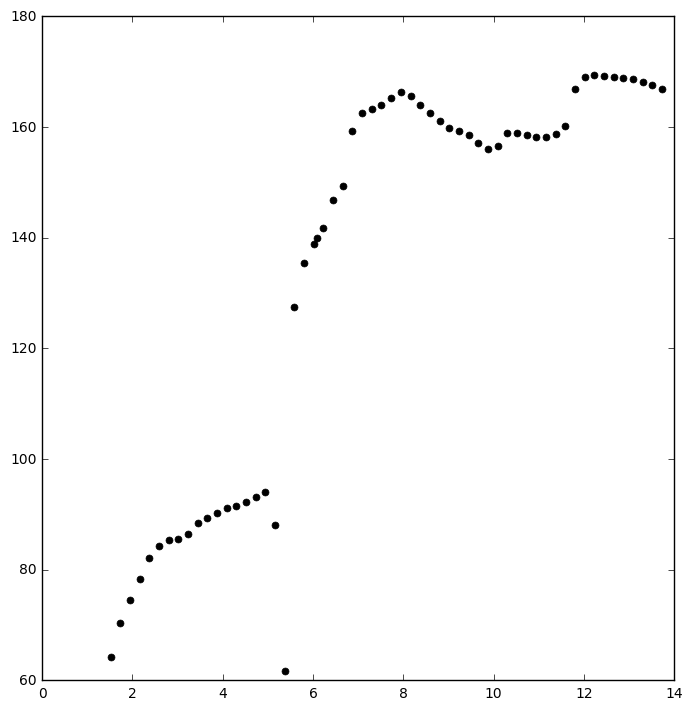

In [9]:
import pynbody
snap = np.loadtxt('/z/dalgorry/snapshots.txt', dtype='string')
snap = sorted(snap, reverse=True)

halo1 = np.loadtxt('/z/dalgorry/datos_salida2/merger_tree-h1.dat')
v = halo1[:,2]
v = np.int_(v)

fig=plt.figure(1,figsize=(8,8))
fig.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
ax1=fig.add_subplot(111)

for j in range(0,len(snap)-1,1):
    
    s=pynbody.load('/srv/cosmdatc/clues/B64_WM3_186592/LG/GAS_SFR/4096_Gasoline/'+str('%s'%snap[j])+'/WMAP3.CLUES.HR.00'+str('%s'%snap[j]))
    h = s.halos()
    h1 = h[v[j]]
    time = s.properties['time'].in_units('Gyr')
    rvir = h1.properties['Rvir']
    
    print snap[j], rvir

    ax1.plot(time,rvir,'.', markersize=10, color = 'k')
    
plt.xlabel('$tiempo\:[Gyr]$', fontsize=26)
plt.ylabel('$r_{vir}\:[kpc]$', fontsize=26)
ax1.minorticks_on()
ax1.tick_params( labelsize=24)
ax1.tick_params('both', length=5, width=1.8,which='minor')
ax1.tick_params('both', length=8, width=1.8,which='major')
plt.show()

1024 13.72956552 166.84


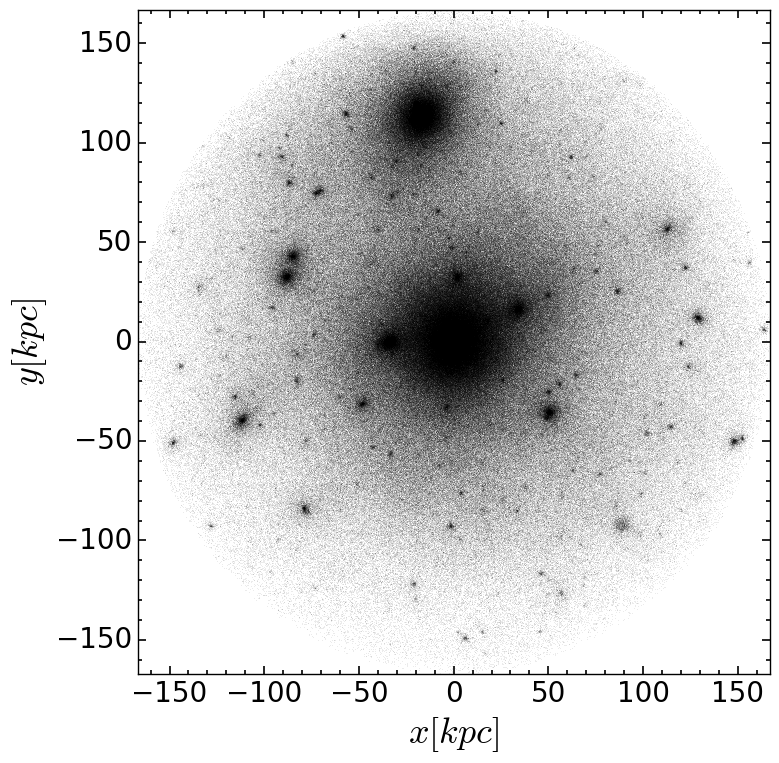

1008 13.5153216321 167.57


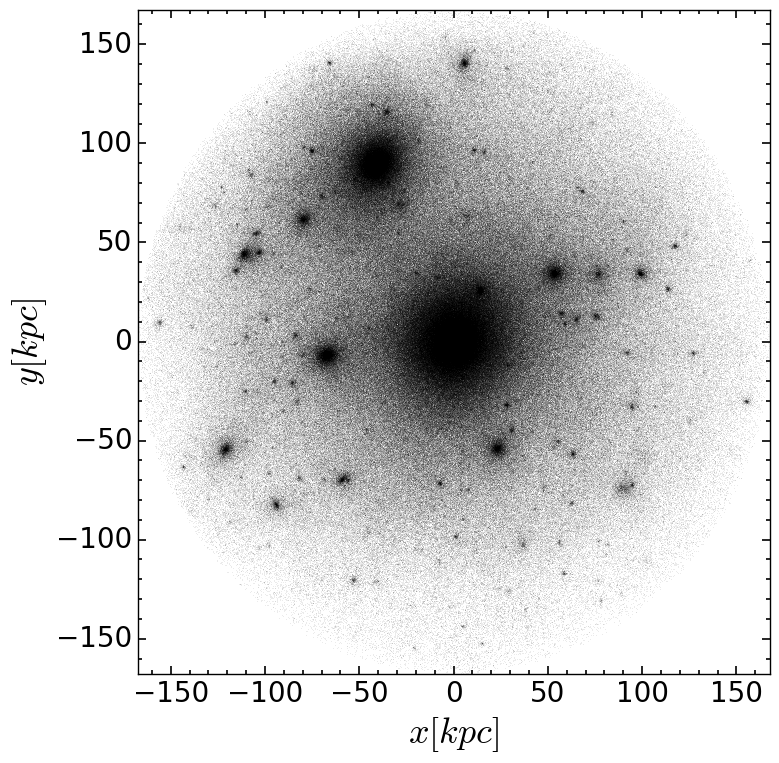

0992 13.3010777442 168.15


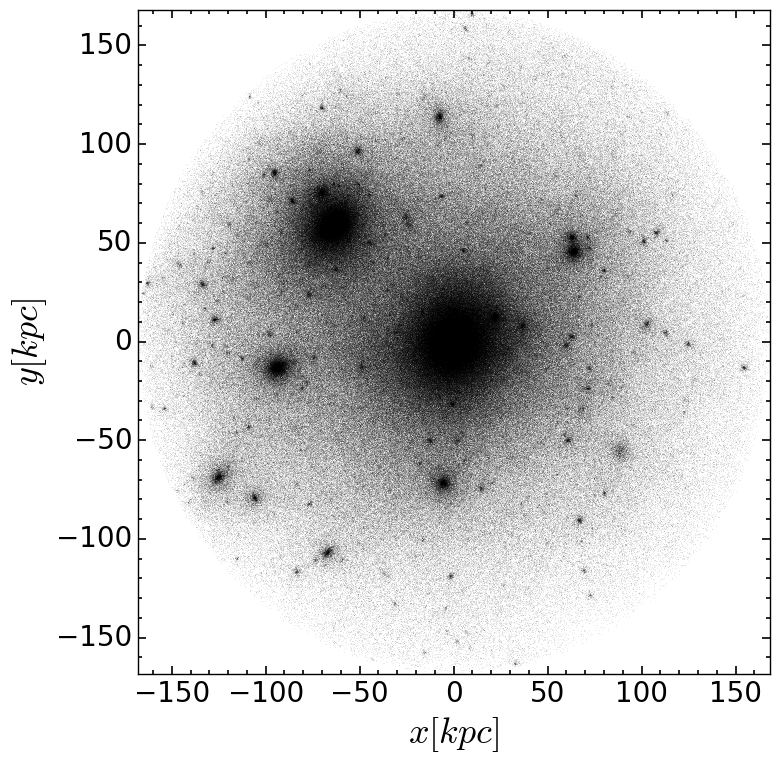

0976 13.0868338563 168.72


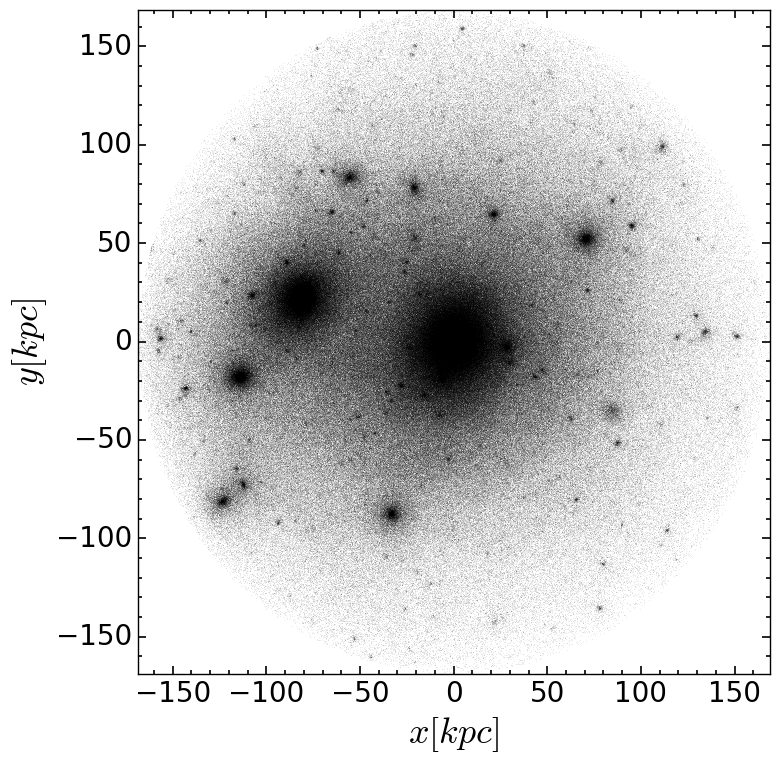

0960 12.8725899684 168.79


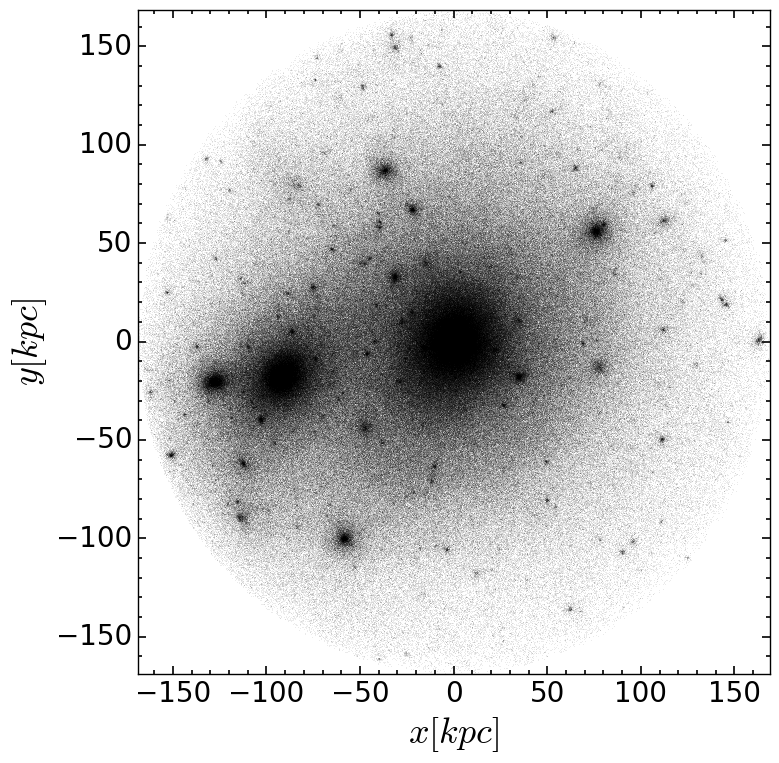

0944 12.6583460805 168.99


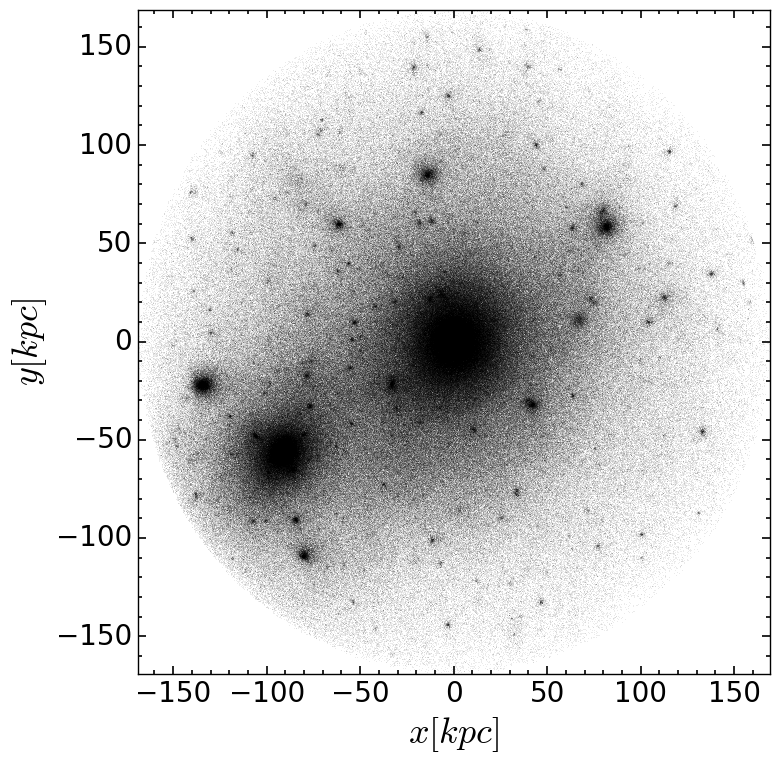

0928 12.4441021926 169.26


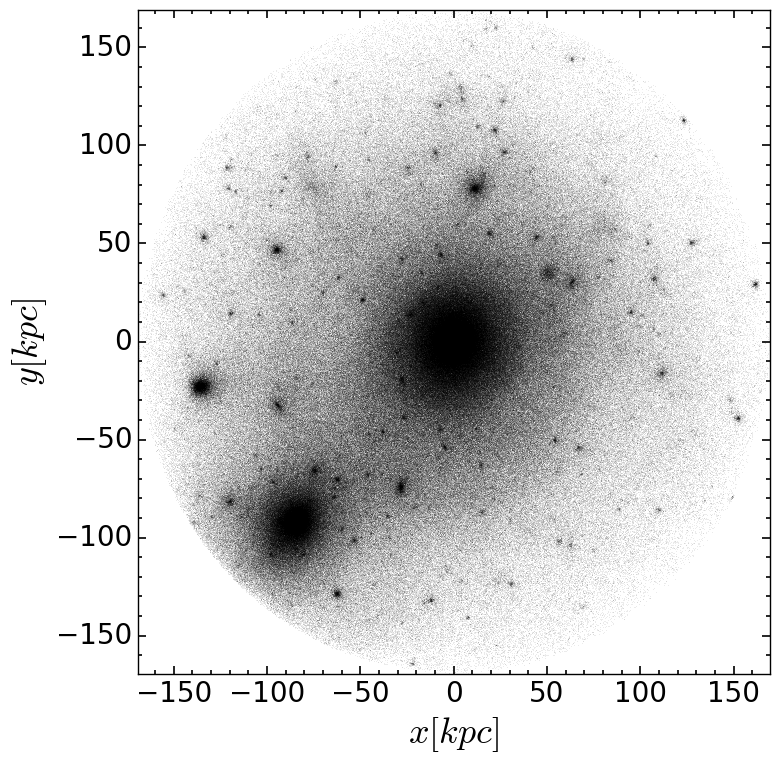

0912 12.2298583047 169.34


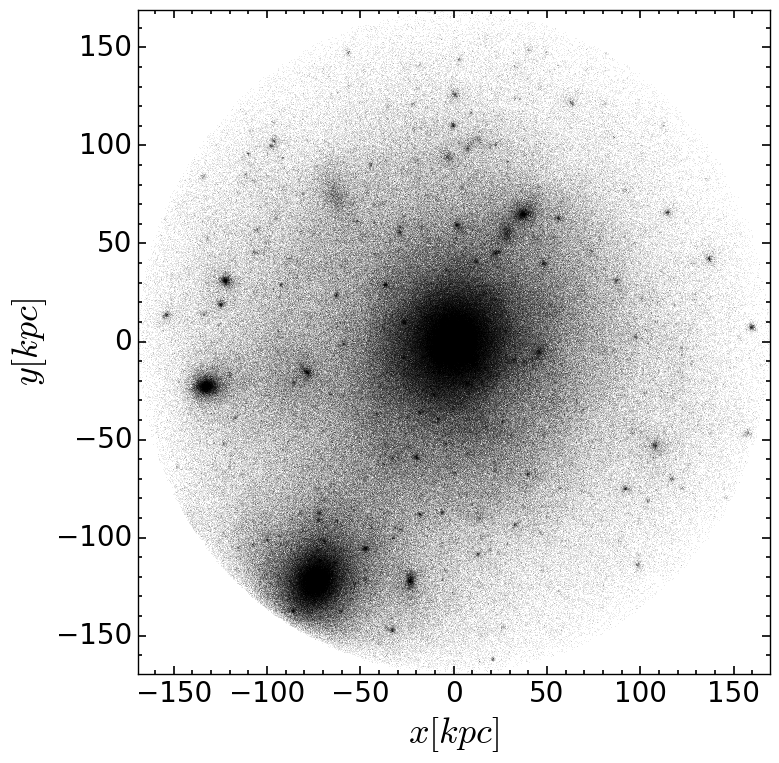

0896 12.0156144168 169.11


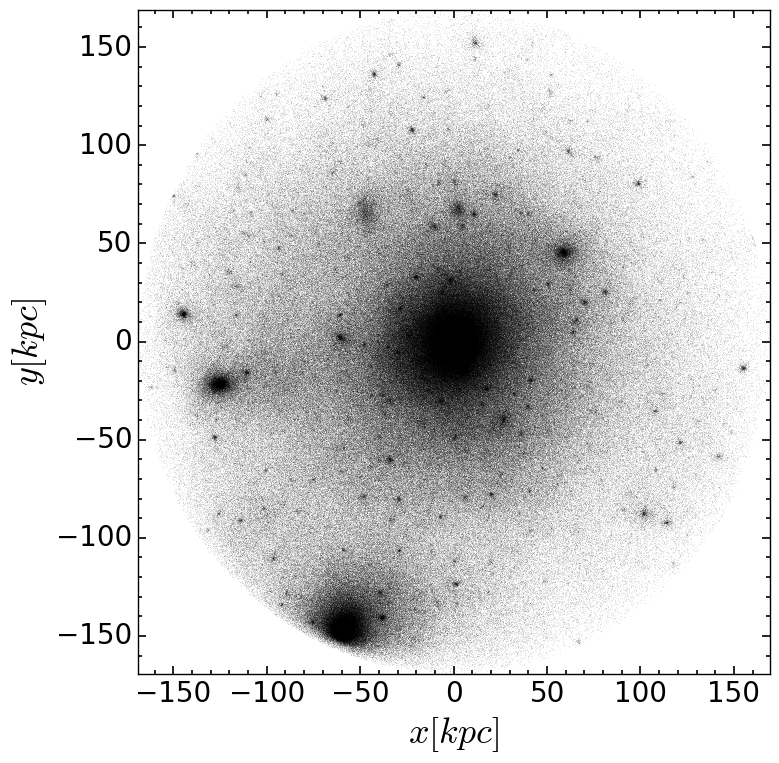

0880 11.8013705289 166.86


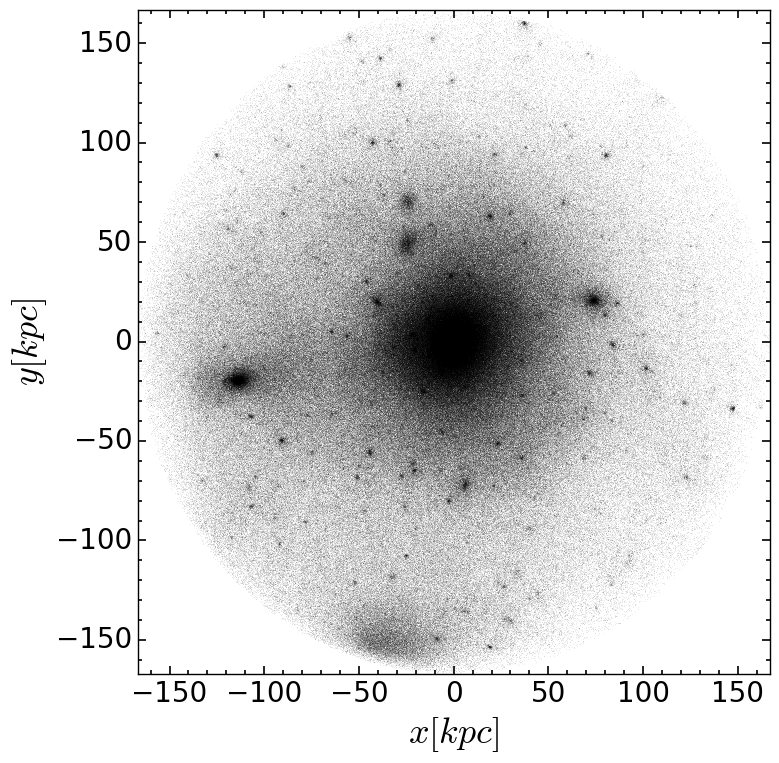

0864 11.587126641 160.14


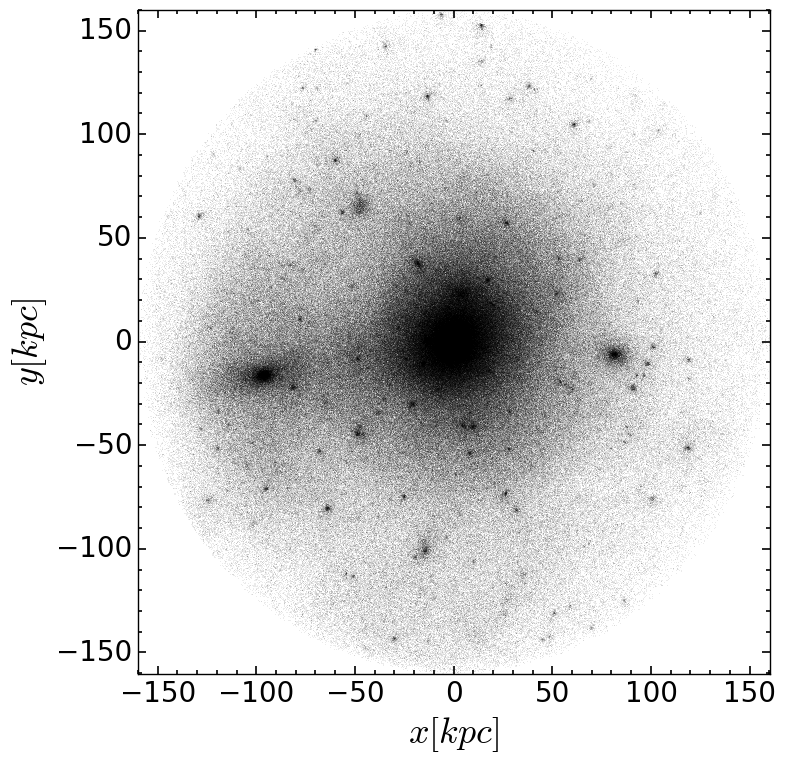

0848 11.3728827531 158.7


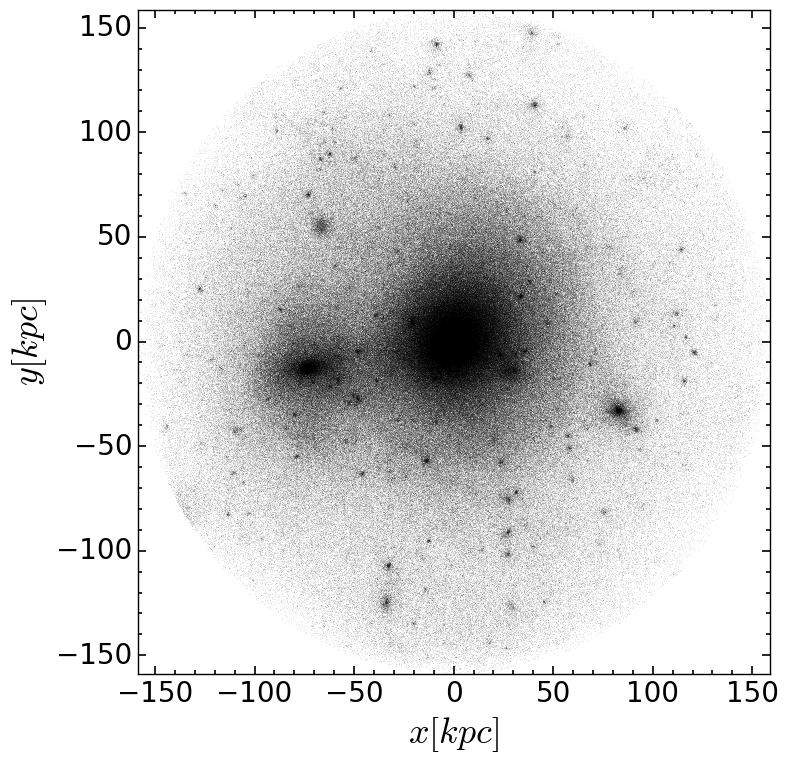

0832 11.1586388652 158.27


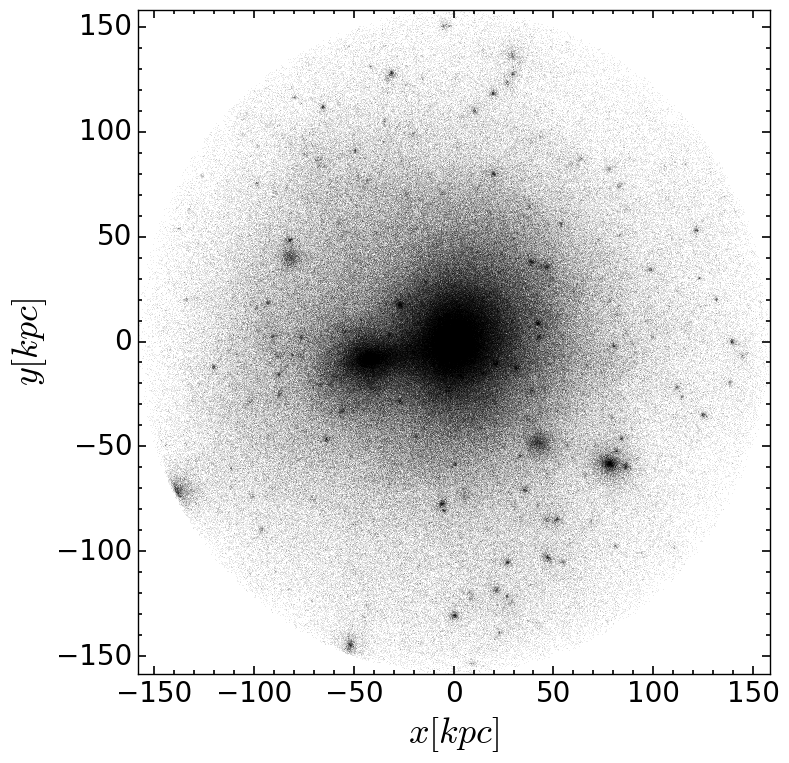

0816 10.9443949773 158.16


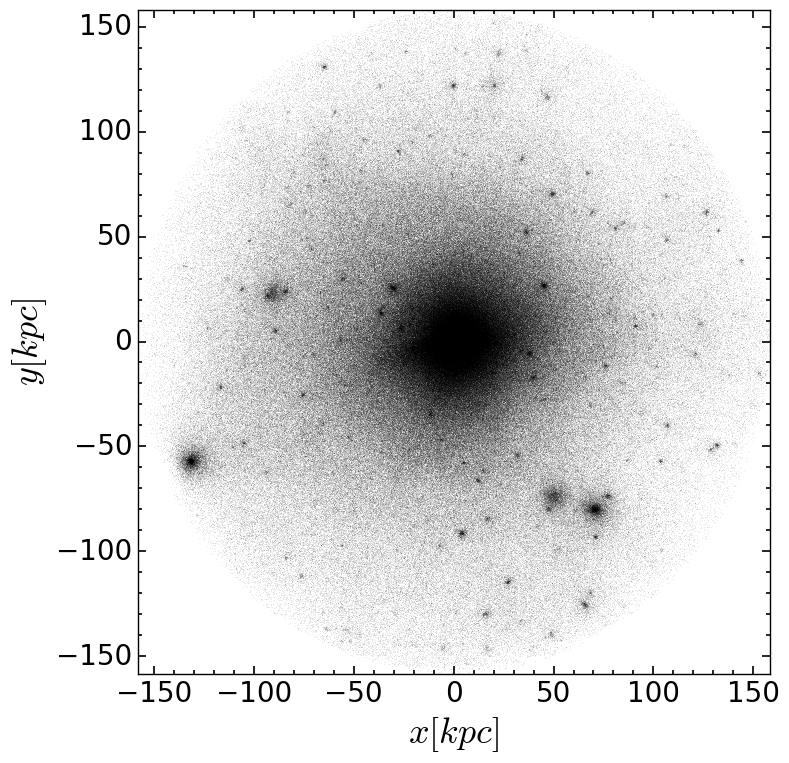

0800 10.7301510894 158.55


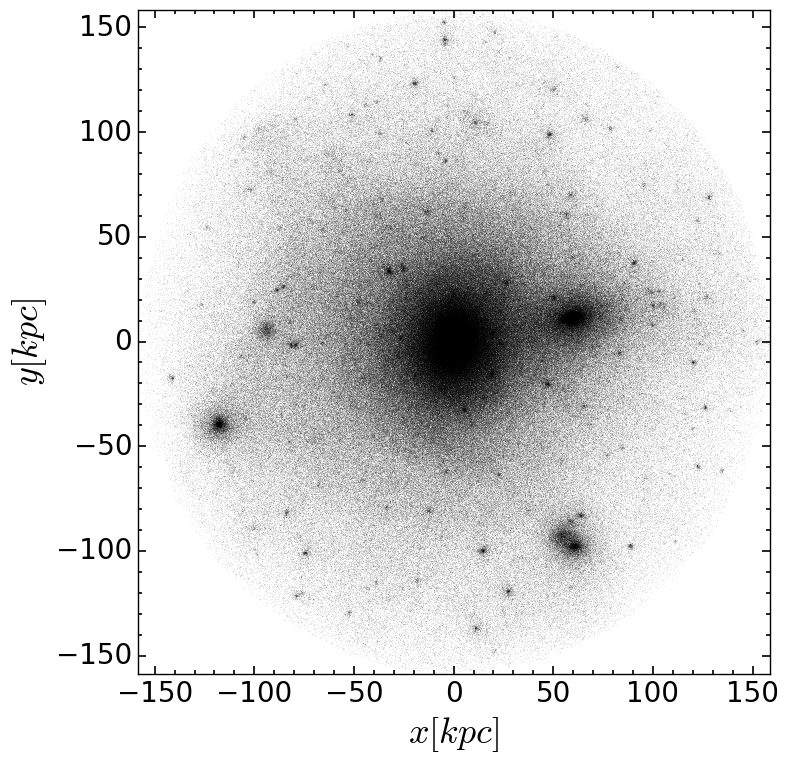

0784 10.5159072015 158.91


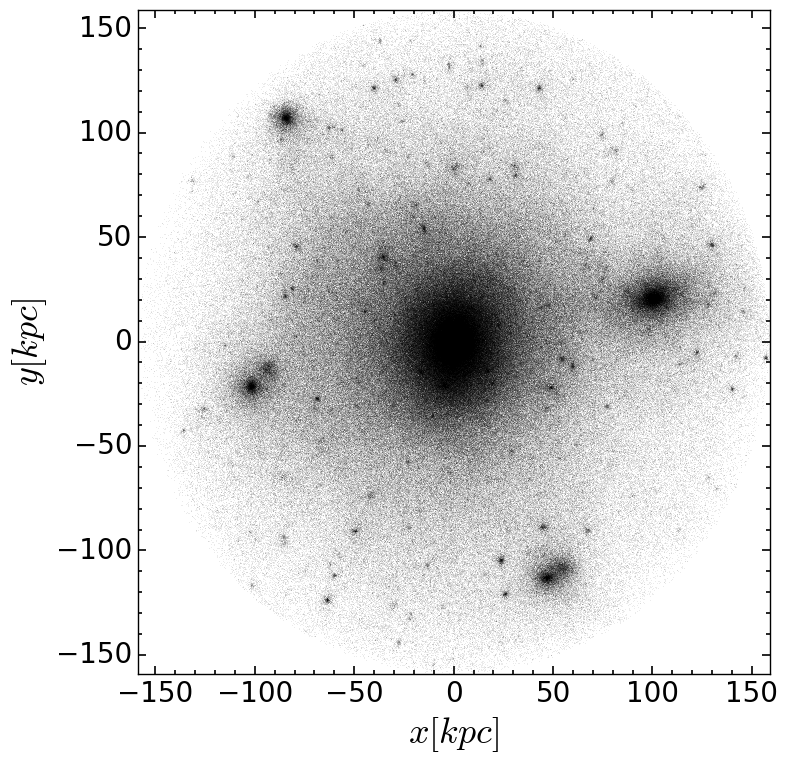

0768 10.3016633136 158.9


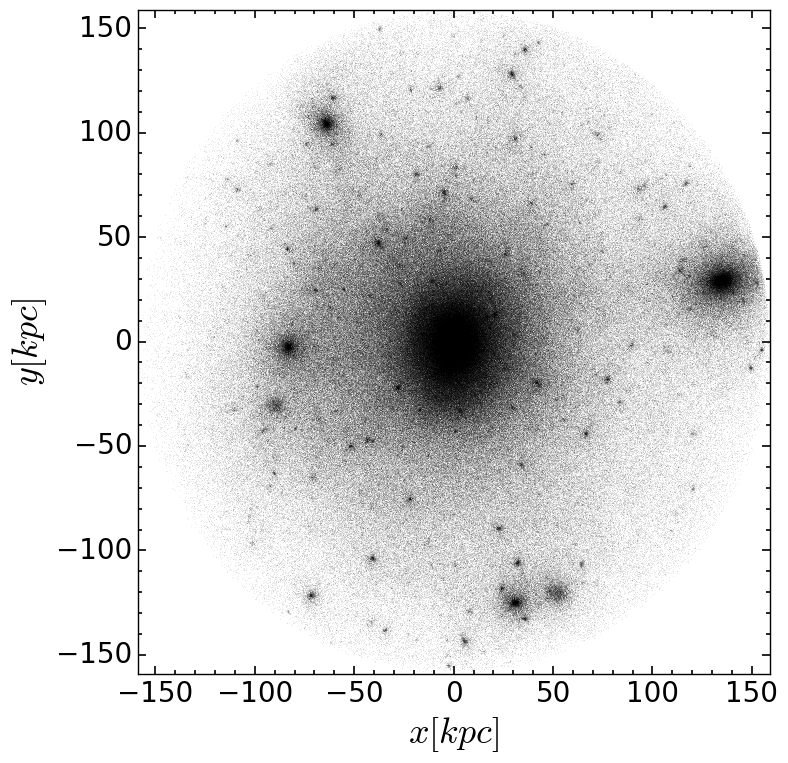

0752 10.0874194257 156.56


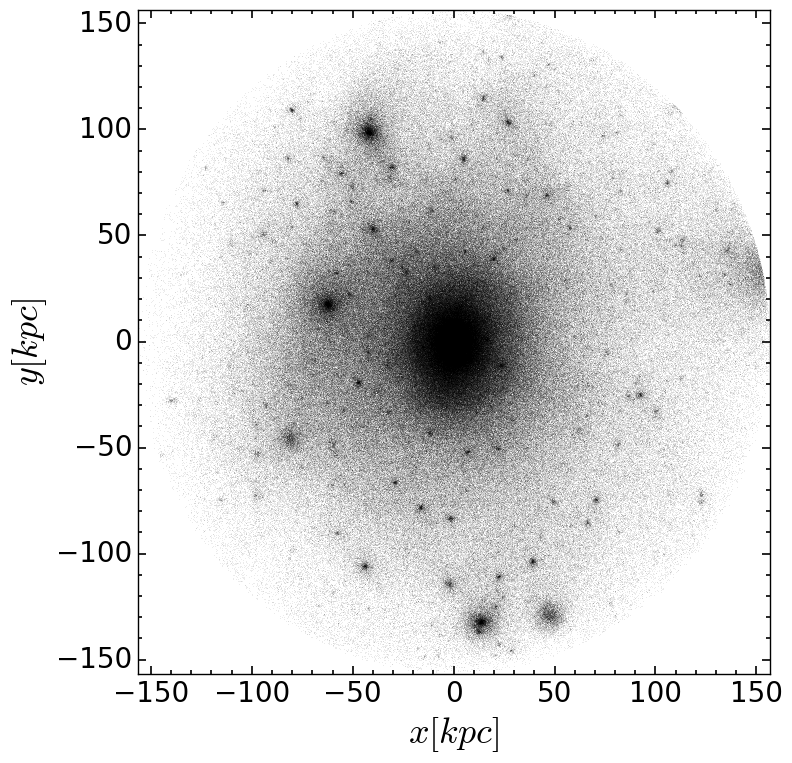

KeyboardInterrupt: 

In [3]:
import pynbody
snap = np.loadtxt('/z/dalgorry/snapshots.txt', dtype='string')
snap = sorted(snap, reverse=True)

halo1 = np.loadtxt('/z/dalgorry/datos_salida2/merger_tree-h1.dat')
v = halo1[:,2]
v = np.int_(v)

for j in range(0,len(snap)-1,1):
    
    s=pynbody.load('/srv/cosmdatc/clues/B64_WM3_186592/LG/GAS_SFR/4096_Gasoline/'+str('%s'%snap[j])+'/WMAP3.CLUES.HR.00'+str('%s'%snap[j]))
    h = s.halos()
    h1 = h[v[j]]
    
    time = s.properties['time'].in_units('Gyr')
    rvir = h1.properties['Rvir']
    
    print snap[j], time, rvir

    cen_pot = pynbody.analysis.halo.center(h1,mode='pot',retcen=True).in_units('kpc')
    x = h1.dm['pos'][:,0].in_units('kpc')-cen_pot[0]
    y = h1.dm['pos'][:,1].in_units('kpc')-cen_pot[1]
    z = h1.dm['pos'][:,2].in_units('kpc')-cen_pot[2]
    r = np.sqrt(x**2+y**2+z**2)

    limit,=np.where(r < rvir)
    
    fig=plt.figure(1, figsize=(8,8))
    fig.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
    ax=fig.add_subplot(111)
    ax.plot(x[limit],y[limit],'.', markersize=0.05, color = 'k')
    ax.set_ylim(-rvir,rvir)
    ax.set_xlim(-rvir,rvir)
    ax.set_xlabel(u'$x[kpc]$', fontsize=26)
    ax.set_ylabel(u'$y[kpc]$', fontsize=26)
    ax.minorticks_on()
    ax.tick_params( labelsize=20)
    ax.tick_params('both', length=3, width=1.2,which='minor')
    ax.tick_params('both', length=6, width=1.2,which='major')
    plt.show()


1024 13.72956552 166.84
1008 13.5153216321 167.57
0992 13.3010777442 168.15
0976 13.0868338563 168.72
0960 12.8725899684 168.79
0944 12.6583460805 168.99
0928 12.4441021926 169.26
0912 12.2298583047 169.34
0896 12.0156144168 169.11
0880 11.8013705289 166.86
0864 11.587126641 160.14
0848 11.3728827531 158.7
0832 11.1586388652 158.27
0816 10.9443949773 158.16
0800 10.7301510894 158.55
0784 10.5159072015 158.91
0768 10.3016633136 158.9
0752 10.0874194257 156.56
0736 9.87317553778 156.04
0720 9.65893164988 157.14
0704 9.44468776198 158.54
0688 9.23044387408 159.35
0672 9.01619998618 159.88
0656 8.80195609828 161.07
0640 8.58771221038 162.53
0624 8.37346832248 164.07
0608 8.15922443458 165.55
0592 7.94498054668 166.38
0576 7.73073665878 165.22
0560 7.51649277088 164.01
0544 7.30224888298 163.36
0528 7.08800499508 162.52
0512 6.87376110718 159.36
0496 6.65951721928 149.36
0480 6.44527333138 146.78
0464 6.23102944348 141.77
0453 6.08373677054 139.9
0448 6.01678555557 138.83
0432 5.80254166767

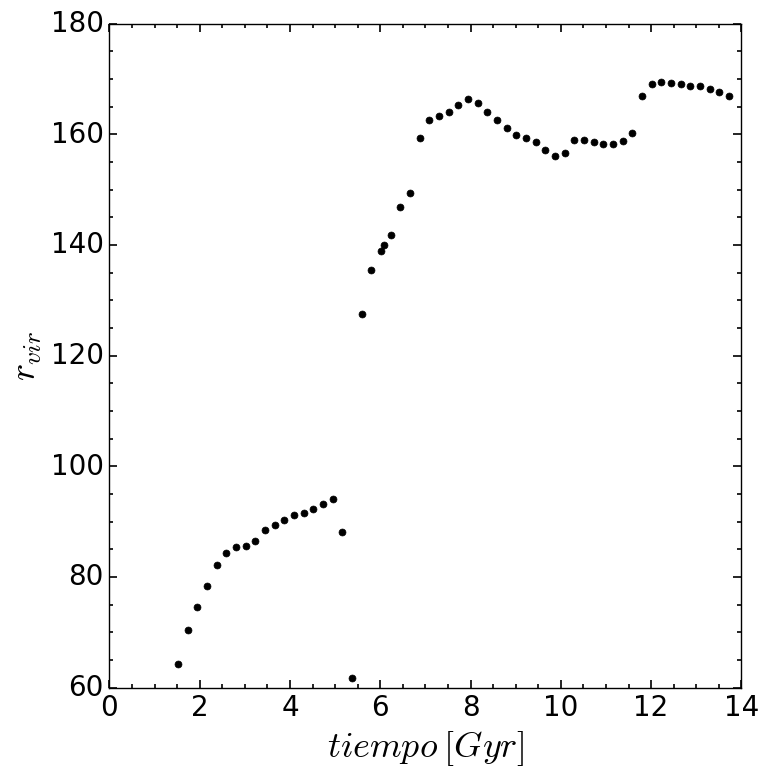

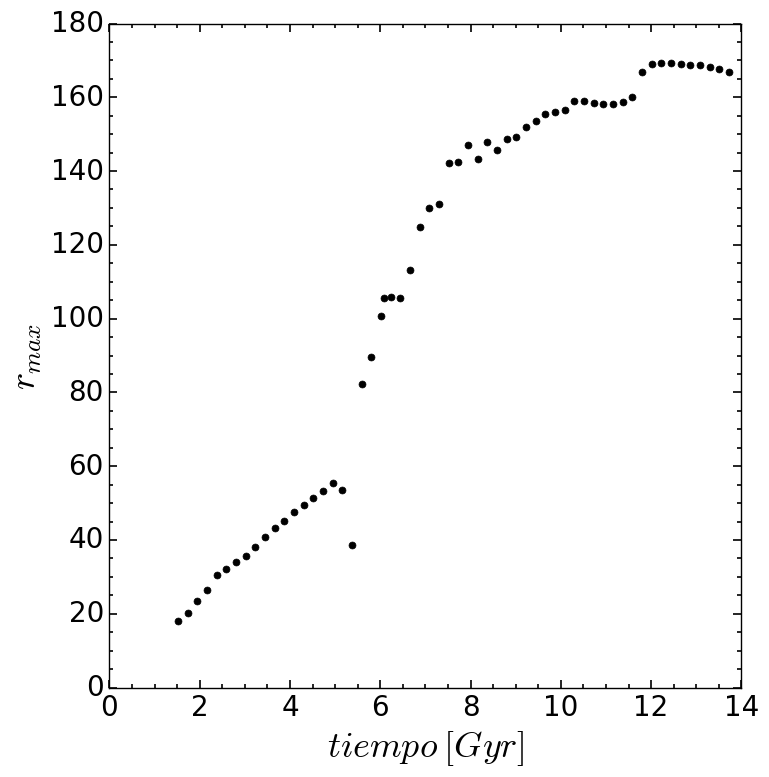

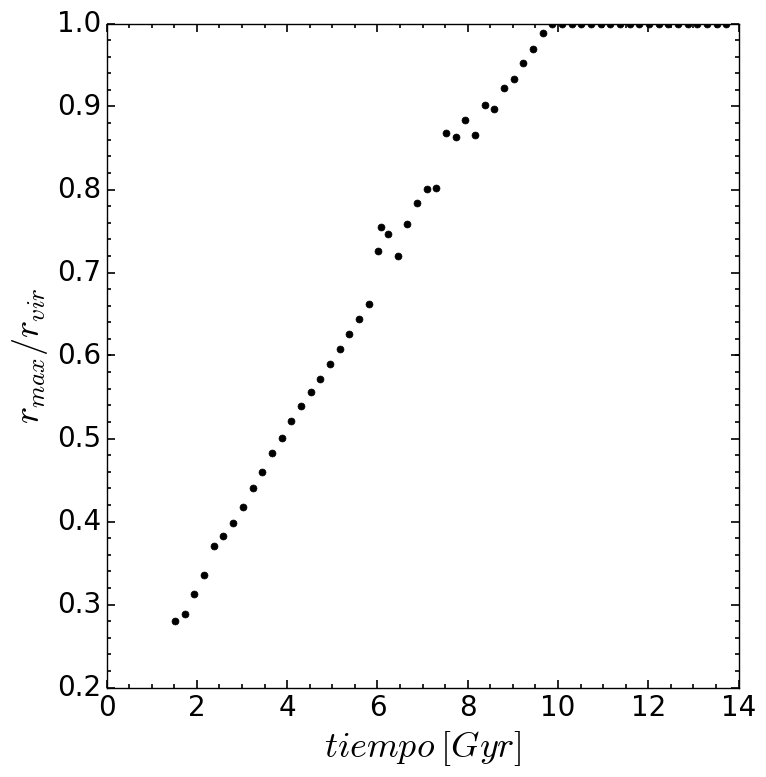

In [5]:
import pynbody
snap = np.loadtxt('/z/dalgorry/snapshots.txt', dtype='string')
snap = sorted(snap, reverse=True)

halo1 = np.loadtxt('/z/dalgorry/datos_salida2/merger_tree-h1.dat')
v = halo1[:,2]
v = np.int_(v)

fo=open('/z/dalgorry/datos_salida2/radio_virial.dat','w')

fig0=plt.figure(0, figsize=(8,8))
fig0.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
ax0=fig0.add_subplot(111)
fig1=plt.figure(1, figsize=(8,8))
fig1.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
ax1=fig1.add_subplot(111)
fig2=plt.figure(2, figsize=(8,8))
fig2.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
ax2=fig2.add_subplot(111)

for j in range(0,len(snap)-1,1):
    
    s=pynbody.load('/srv/cosmdatc/clues/B64_WM3_186592/LG/GAS_SFR/4096_Gasoline/'+str('%s'%snap[j])+'/WMAP3.CLUES.HR.00'+str('%s'%snap[j]))
    h = s.halos()
    h1 = h[v[j]]
    
    time = s.properties['time'].in_units('Gyr')
    rvir = h1.properties['Rvir']
    
    print snap[j], time, rvir

    cen_pot = pynbody.analysis.halo.center(h1,mode='pot',retcen=True).in_units('kpc')
    x = h1.dm['pos'][:,0].in_units('kpc')-cen_pot[0]
    y = h1.dm['pos'][:,1].in_units('kpc')-cen_pot[1]
    z = h1.dm['pos'][:,2].in_units('kpc')-cen_pot[2]
    r = np.sqrt(x**2+y**2+z**2)

    limit,=np.where(r < rvir)
    r_sort = np.sort(r[limit])
    
    cociente = r_sort[-1]/rvir
    
    fo.write(str('%s'% snap[j])+'\t'+
            str('%12.6f' % time)+'\t'+
            str('%12.6f'% rvir)+'\t'+
            str('%12.6f'% r_sort[-1])+'\n')
    fo.flush()
        
    ax0.plot(time,rvir,'.', markersize=10, color = 'k')
    ax1.plot(time,r_sort[-1],'.', markersize=10, color = 'k')
    ax2.plot(time,cociente,'.', markersize=10, color = 'k')
    
ax0.set_xlabel(u'$tiempo\:[Gyr]$', fontsize=26)
ax0.set_ylabel(u'$r_{vir}$', fontsize=26)
ax0.minorticks_on()
ax0.tick_params( labelsize=20)
ax0.tick_params('both', length=3, width=1.2,which='minor')
ax0.tick_params('both', length=6, width=1.2,which='major')
    
#ax.set_ylim(-rvir,rvir)
#ax.set_xlim(-rvir,rvir)
ax1.set_xlabel(u'$tiempo\:[Gyr]$', fontsize=26)
ax1.set_ylabel(u'$r_{max}$', fontsize=26)
ax1.minorticks_on()
ax1.tick_params( labelsize=20)
ax1.tick_params('both', length=3, width=1.2,which='minor')
ax1.tick_params('both', length=6, width=1.2,which='major')


ax2.set_xlabel(u'$tiempo\:[Gyr]$', fontsize=26)
ax2.set_ylabel(u'$r_{max}/r_{vir}$', fontsize=26)
ax2.minorticks_on()
ax2.tick_params( labelsize=20)
ax2.tick_params('both', length=3, width=1.2,which='minor')
ax2.tick_params('both', length=6, width=1.2,which='major')

plt.show()

In [ ]:
import pynbody
snap = np.loadtxt('/z/dalgorry/snapshots.txt', dtype='string')
snap = sorted(snap, reverse=True)

halo1 = np.loadtxt('/z/dalgorry/datos_salida2/merger_tree-h1.dat')
v = halo1[:,2]
v = np.int_(v)

fo=open('/z/dalgorry/datos_salida2/time_snap.dat','w')

for j in range(0,len(snap)-1,1):
    
    s=pynbody.load('/srv/cosmdatc/clues/B64_WM3_186592/LG/GAS_SFR/4096_Gasoline/'+str('%s'%snap[j])+'/WMAP3.CLUES.HR.00'+str('%s'%snap[j]))
    h = s.halos()
    h1 = h[v[j]]
    
    time = s.properties['time'].in_units('Gyr')
    aexp = s.properties['a']
    rvir = h1.properties['Rvir']
    
    fo.write(str('%s'% snap[j])+'\t'+
            str('%12.6f'% time)+'\t'+
            str('%12.6f'% rvir)+'\t'+
            str('%12.6f'% aexp)+'\n')
    fo.flush()
    print j


0
1
2


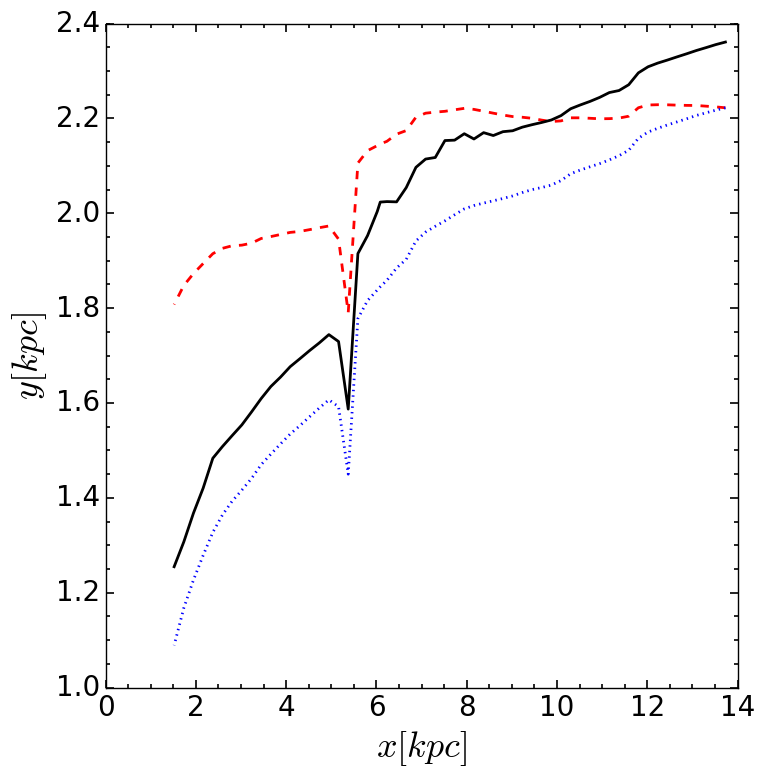

In [19]:
cm = np.loadtxt('/z/dalgorry/datos_salida2/time_snap_test.dat')

cm2=np.loadtxt('/z/dalgorry/A2-krot-s00.dat')
    
t=cm2[:,0]
rvir2 =cm2[:,3]

rmax = cm[:,3]
time = cm[:,1]
rvir = cm[:,2]
aexp = cm[:,4]
hh = cm[:,5]

fig1=plt.figure(1, figsize=(8,8))
fig1.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
ax1=fig1.add_subplot(111)
ax1.plot(time,log10(rvir),'--', lw=2, color = 'red')

ax1.plot(time,log10(rmax),'-',lw=2, color = 'k')
ax1.plot(time,log10(rvir*aexp),':', lw=2, color = 'b')

ax1.set_xlabel(u'$x[kpc]$', fontsize=26)
ax1.set_ylabel(u'$y[kpc]$', fontsize=26)
ax1.minorticks_on()
ax1.tick_params( labelsize=20)
ax1.tick_params('both', length=3, width=1.2,which='minor')
ax1.tick_params('both', length=6, width=1.2,which='major')
plt.show()

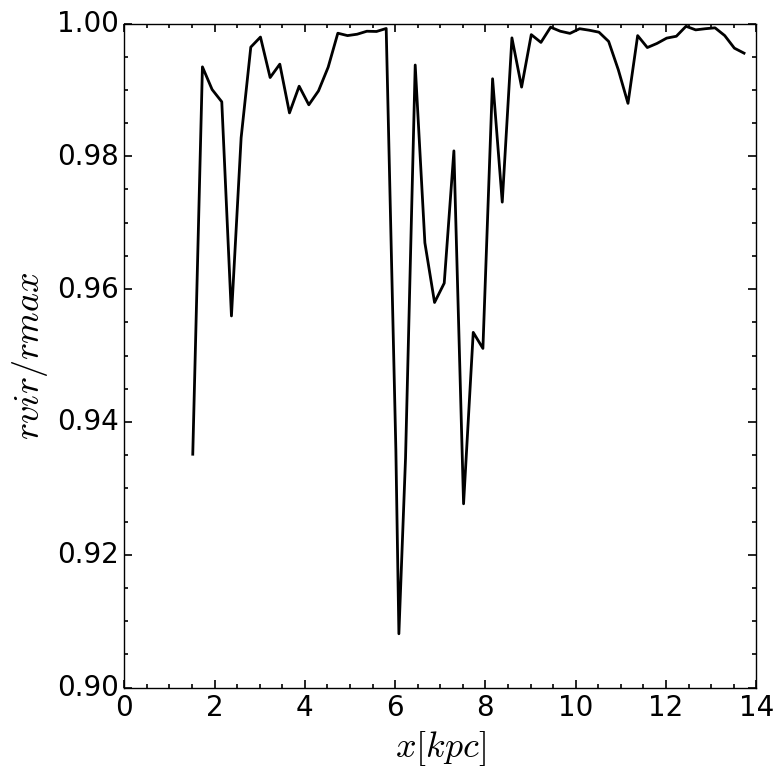

In [10]:
cm = np.loadtxt('/z/dalgorry/datos_salida2/time_snap_test.dat')
rmax = cm[:,3]
time = cm[:,1]
rvir = cm[:,2]
aexp = cm[:,4]
hh = cm[:,5]

fig1=plt.figure(1, figsize=(8,8))
fig1.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
ax1=fig1.add_subplot(111)
ax1.plot(time,(rvir*aexp/hh)/rmax,'-', lw=2, color = 'k')
ax1.set_xlabel(u'$x[kpc]$', fontsize=26)
ax1.set_ylabel(u'$rvir/rmax$', fontsize=26)
ax1.minorticks_on()
ax1.tick_params( labelsize=20)
ax1.tick_params('both', length=3, width=1.2,which='minor')
ax1.tick_params('both', length=6, width=1.2,which='major')
plt.show()

pynbody.analysis.profile : Profile v_circ -- this routine assumes the disk is in the x-y plane
pynbody.analysis.profile : Profile v_circ -- this routine assumes the disk is in the x-y plane
pynbody.analysis.profile : Profile v_circ -- this routine assumes the disk is in the x-y plane
pynbody.analysis.profile : Profile v_circ -- this routine assumes the disk is in the x-y plane


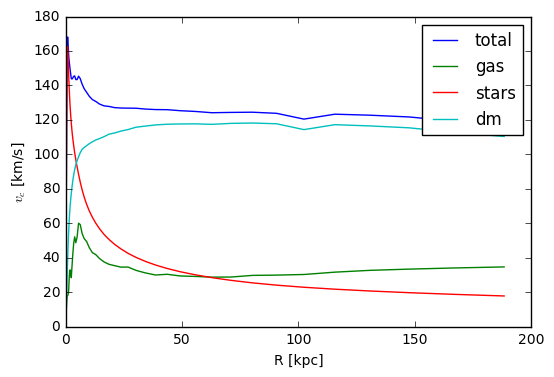

In [11]:
import pynbody
import matplotlib.pylab as plt
from os import environ
# load the snapshot and set to physical units
s=pynbody.load('/srv/cosmdatc/clues/B64_WM3_186592/LG/GAS_SFR/4096_Gasoline/1024/WMAP3.CLUES.HR.001024')

# load the halos
h = s.halos()

# center on the largest halo and align the disk
pynbody.analysis.angmom.faceon(h[1])

# create a profile object for the stars
s.physical_units()
p = pynbody.analysis.profile.Profile(h[1],min=0.001,max=200,type='log',ndim=3)
pg = pynbody.analysis.profile.Profile(h[1].g,min=0.001,max=200,type='log',ndim=3)
ps = pynbody.analysis.profile.Profile(h[1].s,min=0.001,max=200,type='log',ndim=3)
pd = pynbody.analysis.profile.Profile(h[1].d,min=0.001,max=200,type='log',ndim=3)

# make the plot
plt.plot(p['rbins'],p['v_circ'],label='total')
plt.plot(pg['rbins'],pg['v_circ'],label='gas')
plt.plot(ps['rbins'],ps['v_circ'],label='stars')
plt.plot(pd['rbins'],pd['v_circ'],label='dm')

plt.xlabel('R [kpc]')
plt.ylabel(r'$v_c$ [km/s]')
plt.legend()

snap 1024 t= 13.72956552
[-147768.16499625 -146127.54859778 -146085.97084763 -145708.03971386
 -145193.21513745 -144225.18494149 -144037.75717549 -143868.91836687
 -143758.31587467 -143737.39113882]


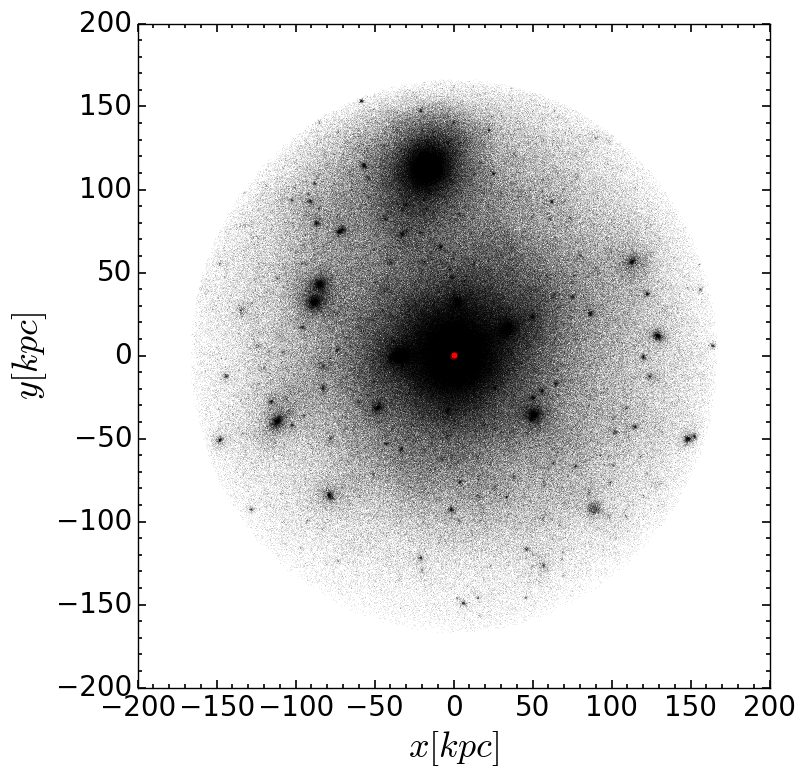

In [7]:
import matplotlib.pyplot as plt 
import numpy as np
import pynbody

snap = np.loadtxt('/z/dalgorry/snapshots.txt', dtype='string')

#fo=open('/z/dalgorry/datos_salida2/merger_tree-h1.dat','w')
aux = 1

for j in range(len(snap)-1,len(snap)-2,-1):
    
    s1=pynbody.load('/srv/cosmdatc/clues/B64_WM3_186592/LG/GAS_SFR/4096_Gasoline/'+str('%s'%snap[j])+'/WMAP3.CLUES.HR.00'+str('%s'%snap[j]))
    h1 = s1.halos()
    
    #s2=pynbody.load('/srv/cosmdatc/clues/B64_WM3_186592/LG/GAS_SFR/4096_Gasoline/'+str('%s'%snap[j-1])+'/WMAP3.CLUES.HR.00'+str('%s'%snap[j-1]))
    #h2 = s2.halos()
    
    time = s1.properties['time'].in_units('Gyr')
    print 'snap', snap[j], 't=', time
    
    h_aux = h1[aux]
    
    r200 = h_aux.properties['Rvir']
    cen_pot = pynbody.analysis.halo.center(h_aux,mode='pot',retcen=True).in_units('kpc')
    x_aux=((h_aux.dm['pos'].in_units('kpc'))[:,0] - cen_pot[0])
    y_aux=((h_aux.dm['pos'].in_units('kpc'))[:,1] - cen_pot[1])
    z_aux=((h_aux.dm['pos'].in_units('kpc'))[:,2] - cen_pot[2])
    r_aux = np.sqrt(x_aux**2 + y_aux**2 + z_aux**2)
    
    limit, = np.where(r_aux < r200)
    
    e_pot = h_aux.dm['phi'].in_units('km**2 s**-2')
    
    vel_aux = h_aux.dm['vel'].in_units('km s**-1')
    mdrk_aux = h_aux.dm['mass'].in_units('Msol')
    
    veloc,=np.where(r_aux < 0.05*r200)
    vxcm_aux = sum(mdrk_aux[veloc]*vel_aux[:,0][veloc])/sum(mdrk_aux[veloc])
    vycm_aux = sum(mdrk_aux[veloc]*vel_aux[:,1][veloc])/sum(mdrk_aux[veloc])
    vzcm_aux = sum(mdrk_aux[veloc]*vel_aux[:,2][veloc])/sum(mdrk_aux[veloc])

    vx_aux = vel_aux[:,0] - vxcm_aux
    vy_aux = vel_aux[:,1] - vycm_aux
    vz_aux = vel_aux[:,2] - vzcm_aux

    e_cinetica = (1/2.)*(vx_aux**2 + vy_aux**2 + vz_aux**2)
    
    energia= e_pot + e_cinetica
    
    e_sort = np.sort(energia[limit])
    e_indice = np.argsort(energia[limit])
    
    ID = h_aux.dm['iord'][e_indice][:10]
    
    #print e_sort[:10]
    
    fig=plt.figure(1, figsize=(8,8))
    fig.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
    ax=fig.add_subplot(111)
    ax.plot(x_aux[limit],y_aux[limit],'.', markersize=0.05, color = 'k')
    ax.plot(x_aux[limit][e_indice][:10],y_aux[limit][e_indice][:10],'o', markersize=5, color = 'red')
    #ax.set_ylim(-1000,1000)
    #ax.set_xlim(-0.7,0)
    ax.set_xlabel(u'$x[kpc]$', fontsize=26)
    ax.set_ylabel(u'$y[kpc]$', fontsize=26)
    ax.minorticks_on()
    ax.tick_params( labelsize=20)
    ax.tick_params('both', length=3, width=1.2,which='minor')
    ax.tick_params('both', length=6, width=1.2,which='major')
    plt.show()
    
    #print ID
    
    '''for i in range (1,100):
        k=0
        
        h_num = h2[i]
        
        ID_num = h_num.dm['iord']

        for ID_part in ID:
            if ID_part in ID_num:
                k += 1
                    
        #fo.write(str('%s'% snap[j])+'\t'+
        #        str('%12.6f' % time)+'\t'+
        #        str('%02d'% k)+'\t'+
        #        str('%02d'% i)+'\n')
        #fo.flush()
        
        print k, 'halo','%s'%i
        if k > 6:
            rvir = h_num.properties['Rvir']
            centro = pynbody.analysis.halo.center(h_num,mode='pot',retcen=True).in_units('kpc')
            x_num=((h_num.dm['pos'].in_units('kpc'))[:,0] - centro[0])
            y_num=((h_num.dm['pos'].in_units('kpc'))[:,1] - centro[1])
            z_num=((h_num.dm['pos'].in_units('kpc'))[:,2] - centro[2])
            r_num = np.sqrt(x_num**2 + y_num**2 + z_num**2)

            limit_num, = np.where(r_num < rvir)
            
            fig=plt.figure(1, figsize=(8,8))
            fig.subplots_adjust(bottom=0.12, left =0.16, right = 0.95, top = 0.95)
            ax=fig.add_subplot(111)
            ax.plot(x_num[limit_num],y_num[limit_num],'.', markersize=0.05, color = 'k')
            ax.plot(x_aux[e_indice][:10],y_aux[e_indice][:10],'o', markersize=5, color = 'red')
            #ax.set_ylim(-1000,1000)
            #ax.set_xlim(-0.7,0)
            ax.set_xlabel(u'$x[kpc]$', fontsize=26)
            ax.set_ylabel(u'$y[kpc]$', fontsize=26)
            ax.minorticks_on()
            ax.tick_params( labelsize=20)
            ax.tick_params('both', length=3, width=1.2,which='minor')
            ax.tick_params('both', length=6, width=1.2,which='major')
            plt.show()
            
            break'''
    aux = i
    

            


In [5]:
?sort